# **Object Detection**

## **drive set up**

In [ ]:
#mount drive
%cd ..
from google.colab import drive
drive.mount('/content/drive')

/
Mounted at /content/drive


## **Data set download**

In [ ]:
# Set correct paths
import os

# Path in your Google Drive where you want to store VOC data
BASE_PATH = '/content/drive/MyDrive/voc'
TAR_PATH = os.path.join(BASE_PATH, 'VOCtrainval_06-Nov-2007.tar')
EXTRACT_PATH = os.path.join(BASE_PATH, 'VOCdevkit')
OUTPUT_DIR = os.path.join(BASE_PATH, 'dataset_yolo')

# Create base directory if it doesn't exist
os.makedirs(BASE_PATH, exist_ok=True)

# Download if tar doesn't exist
if not os.path.exists(TAR_PATH):
    !wget -P {BASE_PATH} http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
else:
    print("✅ Already downloaded.")

# Extract if not already extracted
if not os.path.exists(EXTRACT_PATH):
    !tar -xf {TAR_PATH} -C {BASE_PATH}
else:
    print("✅ Already extracted.")

--2025-05-17 09:00:22--  http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
Resolving host.robots.ox.ac.uk (host.robots.ox.ac.uk)... 129.67.94.152
Connecting to host.robots.ox.ac.uk (host.robots.ox.ac.uk)|129.67.94.152|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 460032000 (439M) [application/x-tar]
Saving to: ‘/content/drive/MyDrive/voc/VOCtrainval_06-Nov-2007.tar’

VOCtrainval_06-Nov- 100%[===================>] 438.72M  22.9MB/s    in 19s     

2025-05-17 09:00:42 (22.6 MB/s) - ‘/content/drive/MyDrive/voc/VOCtrainval_06-Nov-2007.tar’ saved [460032000/460032000]



## **File arrangement**

In [ ]:
import xml.etree.ElementTree as ET
from tqdm import tqdm
import random
import shutil
import yaml

VOC_ROOT = os.path.join(EXTRACT_PATH, 'VOC2007')
CLASSES = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle',
           'bus', 'car', 'cat', 'chair', 'cow', 'diningtable',
           'dog', 'horse', 'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor']

# Create folder structure
for split in ['train', 'val']:
    os.makedirs(os.path.join(OUTPUT_DIR, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(OUTPUT_DIR, split, 'labels'), exist_ok=True)

def convert_annotation(xml_path, output_label_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    img_w = int(root.find('size/width').text)
    img_h = int(root.find('size/height').text)

    with open(output_label_path, 'w') as f:
        for obj in root.iter('object'):
            cls = obj.find('name').text
            if cls not in CLASSES:
                continue
            cls_id = CLASSES.index(cls)
            xml_box = obj.find('bndbox')
            x_min = int(xml_box.find('xmin').text)
            y_min = int(xml_box.find('ymin').text)
            x_max = int(xml_box.find('xmax').text)
            y_max = int(xml_box.find('ymax').text)

            x_center = ((x_min + x_max) / 2.0) / img_w
            y_center = ((y_min + y_max) / 2.0) / img_h
            width = (x_max - x_min) / img_w
            height = (y_max - y_min) / img_h

            f.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

# Read trainval split list
with open(os.path.join(VOC_ROOT, 'ImageSets', 'Main', 'trainval.txt')) as f:
    image_files = f.read().strip().split()

random.shuffle(image_files)

# Split 80/20
split_idx = int(0.8 * len(image_files))
splits = {
    'train': image_files[:split_idx],
    'val': image_files[split_idx:]
}

image_dir = os.path.join(VOC_ROOT, 'JPEGImages')
annot_dir = os.path.join(VOC_ROOT, 'Annotations')

for split, files in splits.items():
    print(f"Processing {split} set...")
    for name in tqdm(files):
        jpg_path = os.path.join(image_dir, f'{name}.jpg')
        xml_path = os.path.join(annot_dir, f'{name}.xml')

        dst_img = os.path.join(OUTPUT_DIR, split, 'images', f'{name}.jpg')
        shutil.copy(jpg_path, dst_img)

        dst_lbl = os.path.join(OUTPUT_DIR, split, 'labels', f'{name}.txt')
        convert_annotation(xml_path, dst_lbl)

# Write data.yaml
data_yaml = {
    'train': os.path.join(OUTPUT_DIR, 'train/images'),
    'val': os.path.join(OUTPUT_DIR, 'val/images'),
    'nc': len(CLASSES),
    'names': CLASSES
}

with open(os.path.join(OUTPUT_DIR, 'data.yaml'), 'w') as f:
    yaml.dump(data_yaml, f)

print("\n✅ Dataset conversion complete and saved in your Google Drive under 'voc' folder.")


Processing train set...


100%|██████████| 4008/4008 [01:49<00:00, 36.57it/s]


Processing val set...


100%|██████████| 1003/1003 [00:19<00:00, 51.78it/s]


✅ Dataset conversion complete and saved in your Google Drive under 'voc' folder.


## **Clone the yolov5 official git repository**

In [ ]:
# Clone YOLOv5 inside your Google Drive (adjust the path if needed)
!git clone https://github.com/ultralytics/yolov5.git /content/drive/MyDrive/yolov5


Cloning into '/content/drive/MyDrive/yolov5'...
remote: Enumerating objects: 17485, done.
remote: Counting objects: 100% (105/105), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 17485 (delta 76), reused 29 (delta 29), pack-reused 17380 (from 4)
Receiving objects: 100% (17485/17485), 16.35 MiB | 14.82 MiB/s, done.
Resolving deltas: 100% (11987/11987), done.


## **Navigate to the yolov5 folder, Install PyTorch and all the required libraries and dependencies**

In [ ]:
!cp /content/drive/MyDrive/yolov5/models/yolov5s.yaml /content/drive/MyDrive/yolov5/models/custom_yolov5s.yaml


In [ ]:
#Navigate to /mydrive/yolov5
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [ ]:
!pip install -r requirements.txt


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 26.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

## **Check if pytorch installed**

In [ ]:

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Setup complete. Using torch 2.6.0+cu124 (Tesla T4)


## **finding classes**

In [ ]:
import os

# Path to your labels folder (adjust accordingly)
labels_path = '/content/drive/MyDrive/voc/dataset_yolo/train/labels'
unique_classes = set()

# Iterate over all label files
for label_file in os.listdir(labels_path):
    if label_file.endswith('.txt'):
        with open(os.path.join(labels_path, label_file), 'r') as f:
            for line in f:
                if line.strip() == '':
                    continue
                class_id = line.split()[0]  # first number is class id
                unique_classes.add(class_id)

print(f"Number of classes: {len(unique_classes)}")
print(f"Class IDs: {sorted(unique_classes)}")


Number of classes: 20
Class IDs: ['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '3', '4', '5', '6', '7', '8', '9']


## **head, backbone,class in** /content/drive/MyDrive/yolov5/models/custom_yolov5s.yaml




In [ ]:
# Parameters
nc: 20 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

In [ ]:
# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

In [ ]:
# Parameters
nc: 20 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

## **Training**

In [ ]:
# Step 1: Train the model with specified parameters
!python /content/drive/MyDrive/yolov5/train.py --img 640 --batch 8 --epochs 50 --data "/content/drive/MyDrive/voc/dataset_yolo/data.yaml" --cfg "/content/drive/MyDrive/yolov5/models/custom_yolov5s.yaml" --weights yolov5s.pt


# Optional: To train faster with caching and saving only final checkpoint
# !python train.py --img 640 --batch 8 --epochs 50 --data data.yaml --cfg custom_yolov5s.yaml --weights yolov5s.pt --nosave --cache

# Step 2: (Optional) Resume training from last checkpoint
# !python train.py --resume --weights runs/train/exp/weights/last.pt --data data.yaml --cfg custom_yolov5s.yaml --epochs 50 --img 640

# Step 3: Launch TensorBoard to visualize training logs
%load_ext tensorboard
%tensorboard --logdir runs/train


Streaming output truncated to the last 5000 lines.
      45/49      2.93G    0.03035    0.03091   0.007112         67        640:  11% 55/501 [00:20<02:28,  3.01it/s]/content/drive/MyDrive/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      45/49      2.93G    0.03036    0.03089   0.007076         56        640:  11% 56/501 [00:20<02:22,  3.13it/s]/content/drive/MyDrive/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      45/49      2.93G    0.03032    0.03097   0.007028         68        640:  11% 57/501 [00:20<02:13,  3.32it/s]/content/drive/MyDrive/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocas

<IPython.core.display.Javascript object>

## **evaluation**

In [ ]:
!python /content/drive/MyDrive/yolov5/val.py --weights /content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt --data "/content/drive/MyDrive/voc/dataset_yolo/data.yaml" --img 640


val: data=/content/drive/MyDrive/voc/dataset_yolo/data.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-418-ga493afe1 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /content/drive/MyDrive/voc/dataset_yolo/val/labels.cache... 1003 images, 0 backgrounds, 0 corrupt: 100% 1003/1003 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 32/32 [00:19<00:00,  1.63it/s]
                   all       1003       3205      0.772      0.652       0.73      0.473
             aeroplane       10

## **downloading the testset**

In [ ]:
# Create the target directory if not exists
!mkdir -p /content/drive/MyDrive/voc/dataset_yolo/test/images

# Download VOC 2007 test images archive (contains only test images)
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtest_06-Nov-2007.tar

# Extract the archive completely (it contains only test images)
!tar -xvf VOCtest_06-Nov-2007.tar

# Move all JPG images from the extracted folder to your target directory
!mv VOCdevkit/VOC2007/JPEGImages/*.jpg /content/drive/MyDrive/voc/dataset_yolo/test/images/

# Clean up extracted files and tarball
!rm -rf VOCdevkit VOCtest_06-Nov-2007.tar



Streaming output truncated to the last 5000 lines.
VOCdevkit/VOC2007/JPEGImages/000725.jpg
VOCdevkit/VOC2007/JPEGImages/000727.jpg
VOCdevkit/VOC2007/JPEGImages/000732.jpg
VOCdevkit/VOC2007/JPEGImages/000734.jpg
VOCdevkit/VOC2007/JPEGImages/000735.jpg
VOCdevkit/VOC2007/JPEGImages/000736.jpg
VOCdevkit/VOC2007/JPEGImages/000737.jpg
VOCdevkit/VOC2007/JPEGImages/000741.jpg
VOCdevkit/VOC2007/JPEGImages/000743.jpg
VOCdevkit/VOC2007/JPEGImages/000744.jpg
VOCdevkit/VOC2007/JPEGImages/000745.jpg
VOCdevkit/VOC2007/JPEGImages/000747.jpg
VOCdevkit/VOC2007/JPEGImages/000749.jpg
VOCdevkit/VOC2007/JPEGImages/000751.jpg
VOCdevkit/VOC2007/JPEGImages/000757.jpg
VOCdevkit/VOC2007/JPEGImages/000758.jpg
VOCdevkit/VOC2007/JPEGImages/000759.jpg
VOCdevkit/VOC2007/JPEGImages/000762.jpg
VOCdevkit/VOC2007/JPEGImages/000765.jpg
VOCdevkit/VOC2007/JPEGImages/000766.jpg
VOCdevkit/VOC2007/JPEGImages/000769.jpg
VOCdevkit/VOC2007/JPEGImages/000773.jpg
VOCdevkit/VOC2007/JPEGImages/000775.jpg
VOCdevkit/VOC2007/JPEGImages/

In [ ]:
import os
import random
import shutil

# Paths
all_images_path = "/content/drive/MyDrive/voc/dataset_yolo/test/images"
temp_test_path = "/content/drive/MyDrive/voc/dataset_yolo/test/selected15"

# Create temporary folder
os.makedirs(temp_test_path, exist_ok=True)

# Get list of JPG files and randomly select 15
all_images = [f for f in os.listdir(all_images_path) if f.endswith(".jpg")]
sample_images = random.sample(all_images, 15)

# Copy selected images
for img in sample_images:
    shutil.copy(os.path.join(all_images_path, img), temp_test_path)


## **testing**

In [ ]:
!python /content/drive/MyDrive/yolov5/detect.py \
  --source "/content/drive/MyDrive/voc/dataset_yolo/test/selected15" \
  --weights "/content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt" \
  --img 640 \
  --conf 0.2 \
  --save-txt \
  --save-conf


detect: weights=['/content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/voc/dataset_yolo/test/selected15, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-418-ga493afe1 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/15 /content/drive/MyDrive/voc/dataset_yolo/test/selected15/000324.jpg: 480x640 1 dog, 29.1ms
image 2/15 /content/drive/MyDrive/voc/dataset_yolo/test/selected15/001276.jpg: 480x640 7 chairs, 1 diningtable, 9.3ms
image 3/15 /content/dri

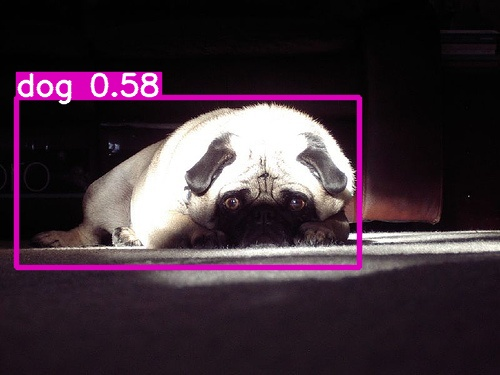

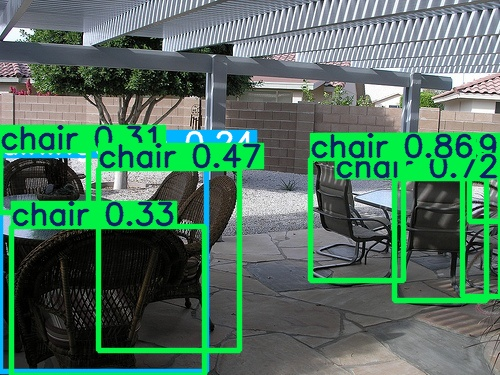

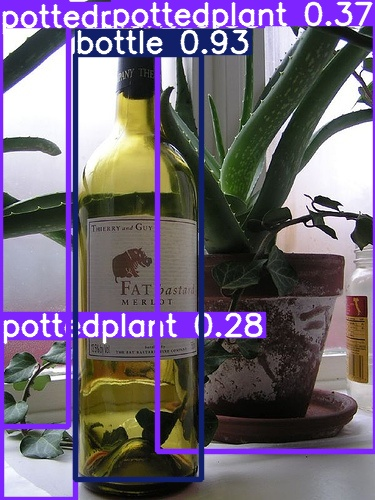

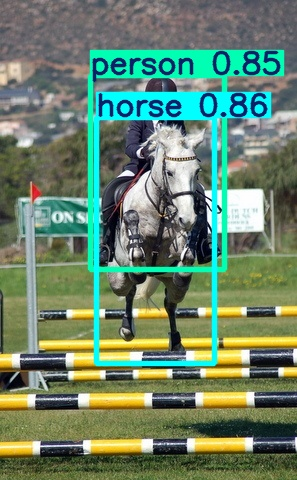

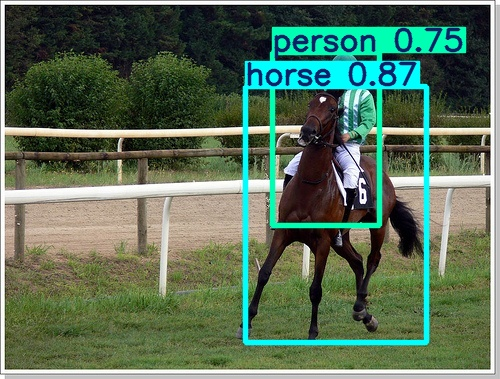

...

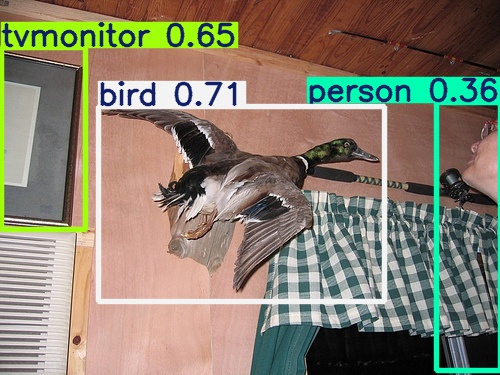

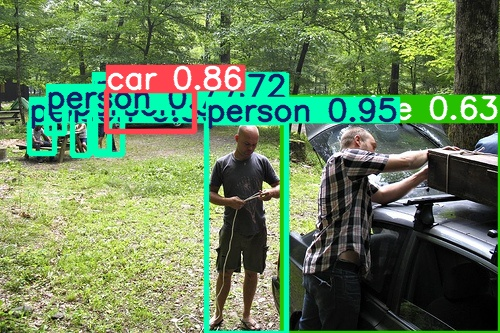

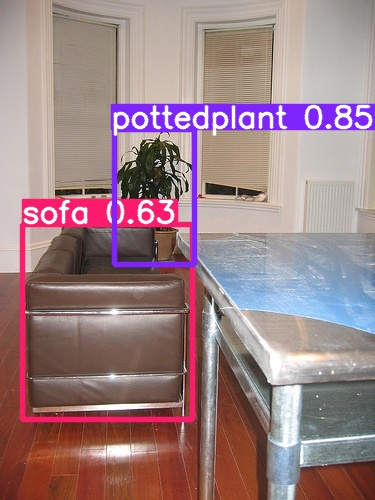

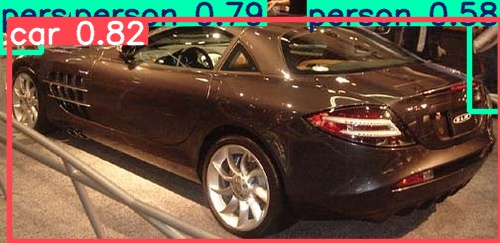

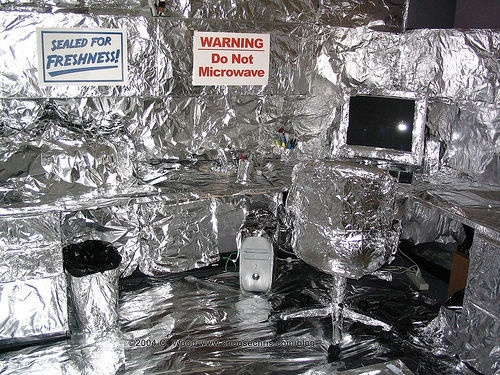

In [ ]:
import glob
from IPython.display import Image, display

# Change this if the exp folder name is different (e.g., exp3, exp4, etc.)
output_folder = '/content/drive/MyDrive/yolov5/runs/detect/exp'

# Display only JPG results from the output folder
for image_path in glob.glob(f'{output_folder}/*.jpg'):
    display(Image(filename=image_path))
    print("\n")


## **References**

https://github.com/ultralytics/yolov5

https://blog.roboflow.com/how-to-train-yolov5-on-a-custom-dataset/

https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb

https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb

https://github.com/ultralytics/yolov5/releases